In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
img = cv2.imread('1.jpg')

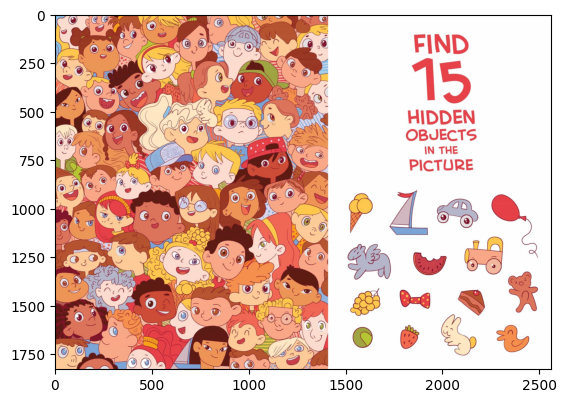

In [3]:
plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))

In [4]:
template = cv2.imread('Finding_templates/image_1/rabbit.jpg')

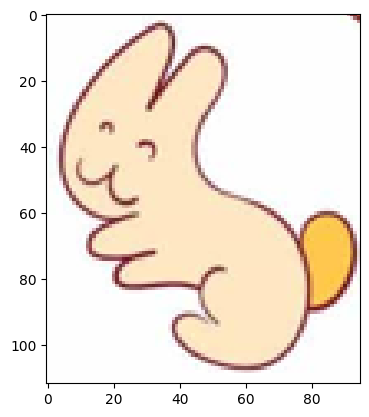

In [5]:
plt.imshow(cv2.cvtColor(template,cv2.COLOR_BGR2RGB))

In [6]:
rs = cv2.matchTemplate(template,img,method=cv2.TM_CCORR_NORMED)

In [7]:
def remove_white_background(image):
    # Convert gray
    if len(image.shape) > 2:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image
    
    # Use threshold
    _, mask = cv2.threshold(gray, 250, 255, cv2.THRESH_BINARY_INV)
    
    # Apply mask
    result = cv2.bitwise_and(image, image, mask=mask)
    
    return result



def preprocess_image(image):
    # Convert img to gray
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image.copy()
    
    # Use GaussianBlur to reduce noise
    blurred = cv2.GaussianBlur(gray, (7, 7), 0)
    
    # equalized histogram to decrease contrast
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(5,5))

    equalized = clahe.apply(blurred)

    mean_val = np.mean(equalized)  # Calculate the mean of the image
    equalized = equalized - mean_val  # Subtract the mean

    
    return equalized

def calculate_histogram(image, mask=None):
    hist = cv2.calcHist([image], [0], mask, [32], [0, 256])
    cv2.normalize(hist, hist, 0, 1)
    return hist


def find_template(image, template, scales=np.linspace(0.7, 1, 50), method=cv2.TM_CCOEFF_NORMED):
    # Preprocess the image and template
    processed_image = preprocess_image(image)
    best_match = None
    best_val = -1
    best_scale = 0.7
    
    # Calculate histogram for template
    template_hist = calculate_histogram(template, None)  # Assuming no mask is needed
    
    for scale in scales:
        # Resize the template based on scale
        scaled_template = cv2.resize(template, None, fx=scale, fy=scale)
        
        # Ensure template is smaller than the image
        if scaled_template.shape[0] > processed_image.shape[0] or scaled_template.shape[1] > processed_image.shape[1]:
            continue
        
        processed_template = preprocess_image(scaled_template)
        result = cv2.matchTemplate(processed_image, processed_template, method)
        plt.imshow(result)
        _, max_val, _, max_loc = cv2.minMaxLoc(result)
        
        # Calculate histogram for the current ROI
        roi = processed_image[max_loc[1]:max_loc[1] + scaled_template.shape[0], max_loc[0]:max_loc[0] + scaled_template.shape[1]]
        roi_hist = calculate_histogram(roi, None)
        
        # Compare histograms
        hist_match = cv2.compareHist(template_hist, roi_hist, cv2.HISTCMP_CORREL)
        
        # Combine template match value with histogram comparison
        combined_val = (0.7 * max_val) + (0.3 * hist_match)

        
        if combined_val > best_val:
            best_val = combined_val
            best_match = max_loc
            best_scale = scale
    
    return best_match, best_val, best_scale

def resize_image_to_fit_screen(image, max_width=1280, max_height=720):
    height, width = image.shape[:2]
    if width > max_width or height > max_height:
        scaling_factor = min(max_width / width, max_height / height)
        new_width = int(width * scaling_factor)
        new_height = int(height * scaling_factor)
        resized_image = cv2.resize(image, (new_width, new_height), interpolation=cv2.INTER_AREA)
        return resized_image
    return image

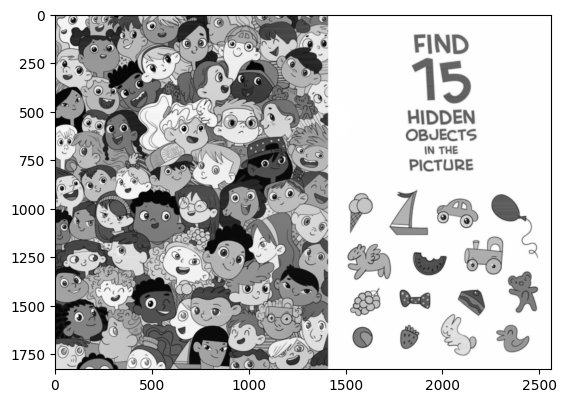

In [8]:
plt.imshow(preprocess_image(img),cmap='gray')

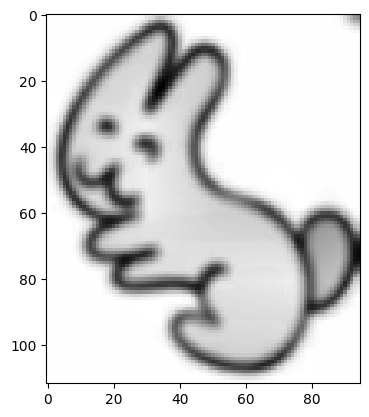

In [9]:
plt.imshow(preprocess_image(template),cmap='gray')

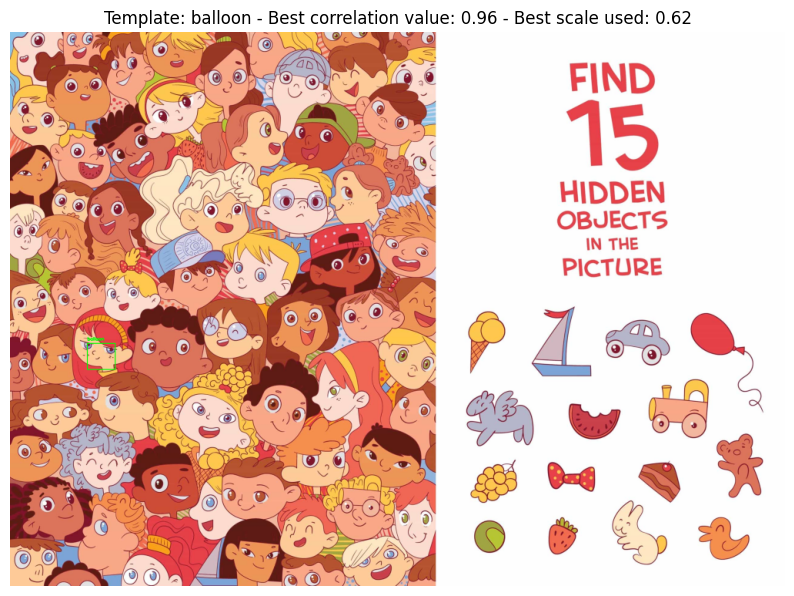

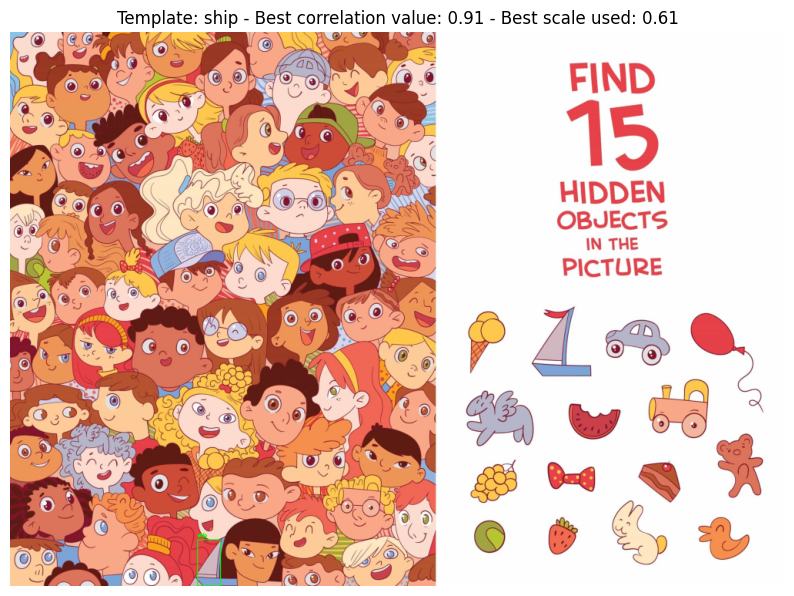

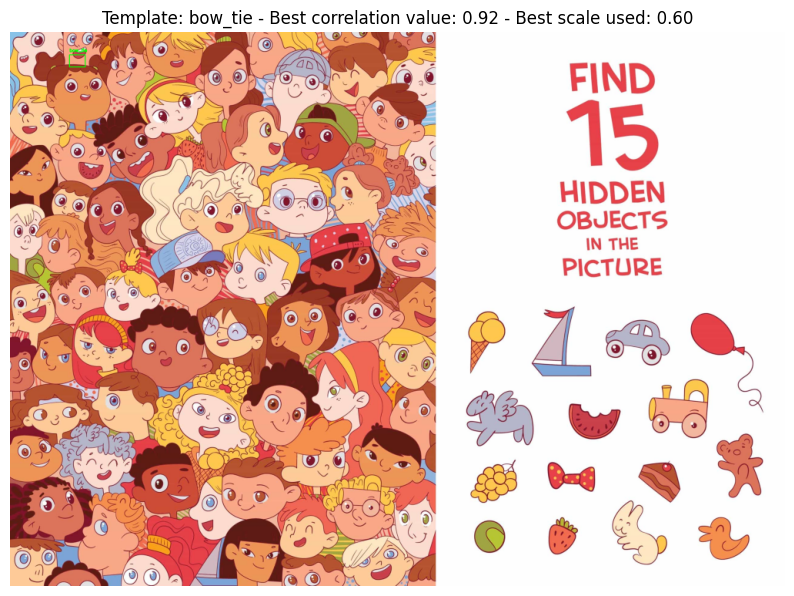

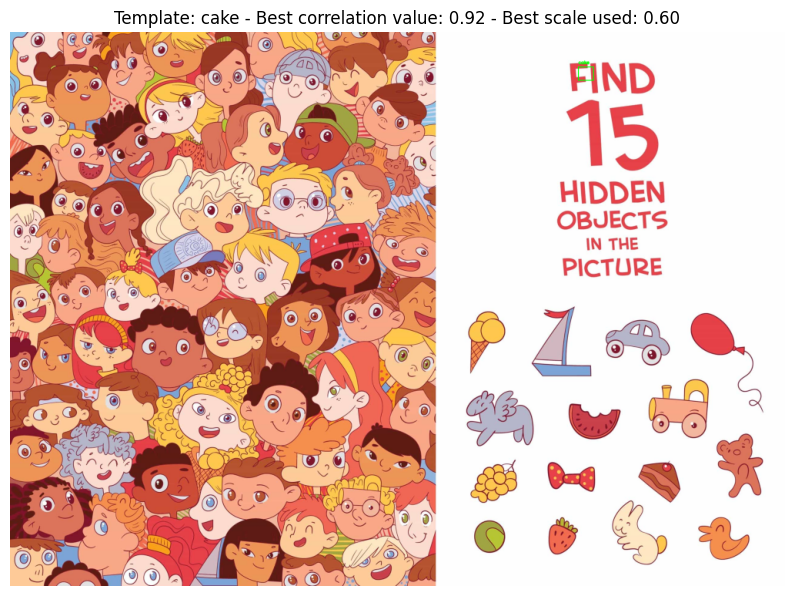

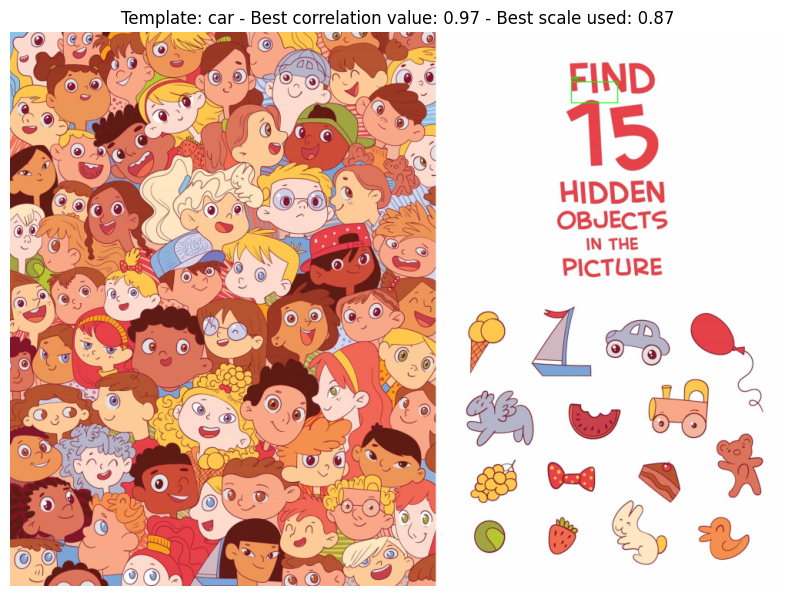

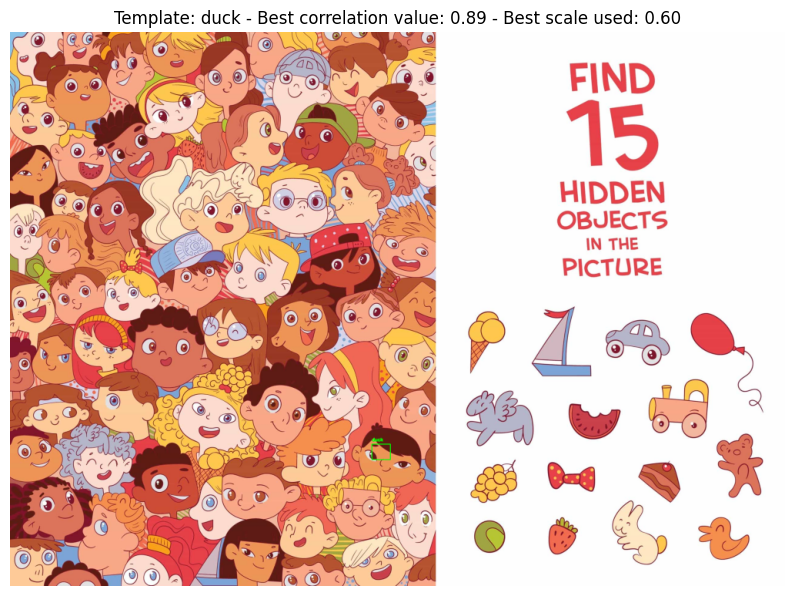

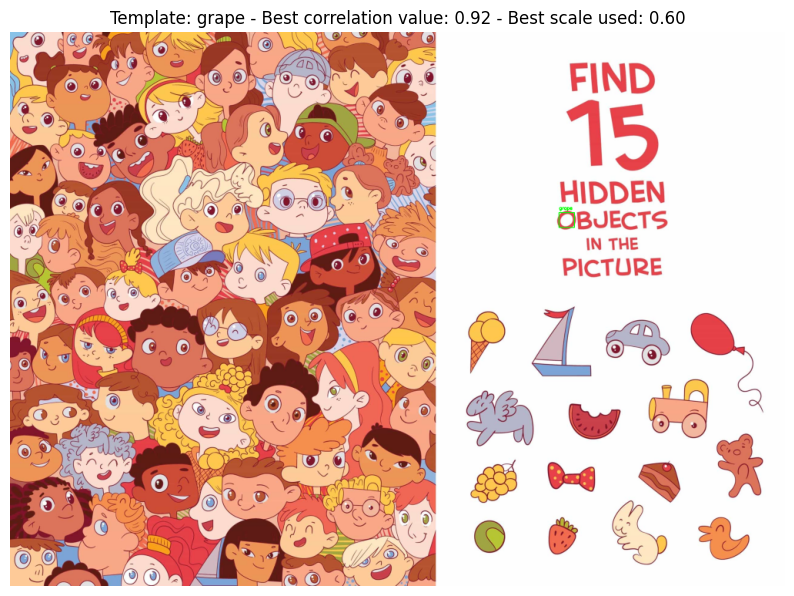

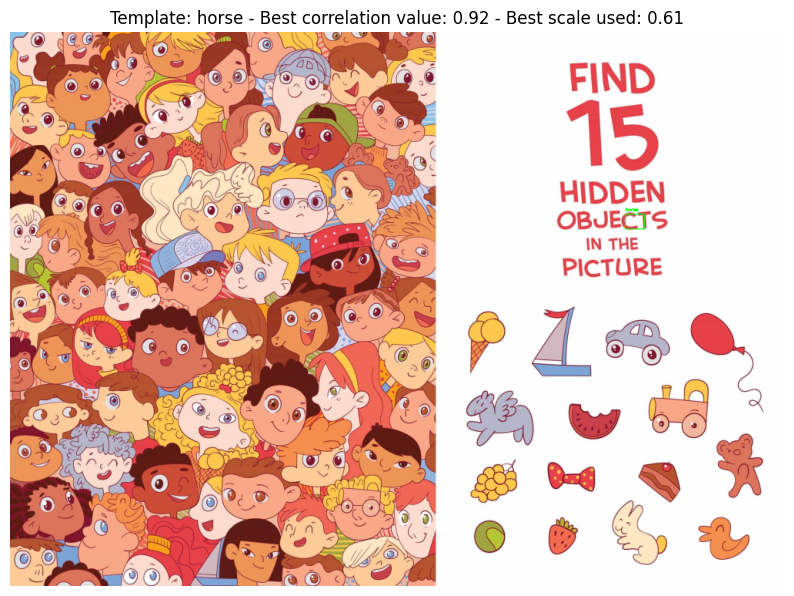

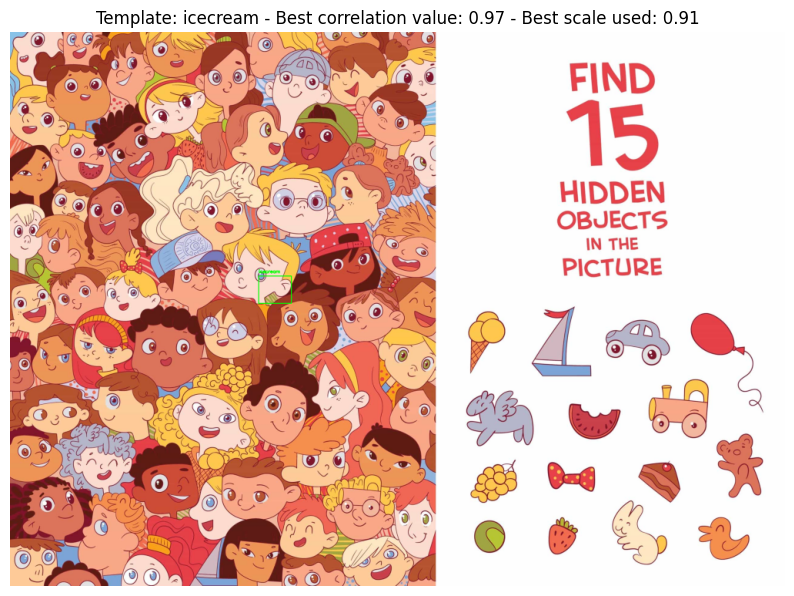

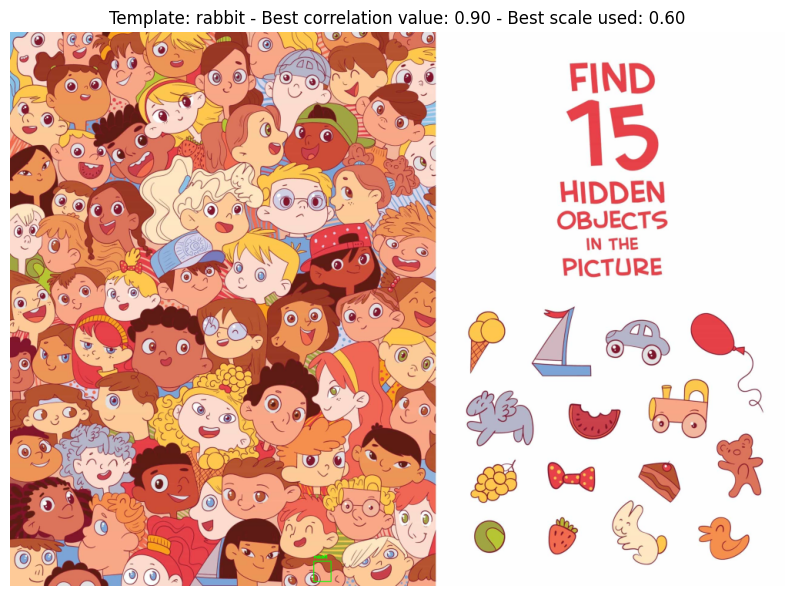

KeyboardInterrupt: 

In [10]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Danh sách tên các template
templates_name = ["balloon", "ship", "bow_tie", "cake", "car", "duck", "grape", "horse", 
                  "icecream", "rabbit", "strawberry", "teddy", "tennis_ball", "train", "watermelon"]

# Hàm loại bỏ nền trắng
def remove_white_background(image):
    if len(image.shape) > 2:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image
    
    _, mask = cv2.threshold(gray, 245, 255, cv2.THRESH_BINARY_INV)
    result = cv2.bitwise_and(image, image, mask=mask)
    return result

# Hàm tiền xử lý ảnh
def preprocess_image(image):
    if len(image.shape) == 3:
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image.copy()
    
    blurred = cv2.GaussianBlur(gray, (7, 7), 0)
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(7, 7))
    equalized = clahe.apply(blurred)
    
    return equalized

# Hàm tính histogram
def calculate_histogram(image, mask=None):
    hist = cv2.calcHist([image], [0], mask, [256], [0, 256])
    cv2.normalize(hist, hist, 0, 1)
    return hist

# Hàm tìm template
def find_template(image, template, scales=np.linspace(0.6, 1, 100), method=cv2.TM_CCORR_NORMED):
    processed_image = preprocess_image(image)
    best_match = None
    best_val = -1
    best_scale = 0.7
    
    template_hist = calculate_histogram(template, None)
    
    for scale in scales:
        scaled_template = cv2.resize(template, None, fx=scale, fy=scale)
        
        if scaled_template.shape[0] > processed_image.shape[0] or scaled_template.shape[1] > processed_image.shape[1]:
            continue
        
        processed_template = preprocess_image(scaled_template)
        result = cv2.matchTemplate(processed_image, processed_template, method)
        _, max_val, _, max_loc = cv2.minMaxLoc(result)
        
        roi = processed_image[max_loc[1]:max_loc[1] + scaled_template.shape[0], 
                              max_loc[0]:max_loc[0] + scaled_template.shape[1]]
        roi_hist = calculate_histogram(roi, None)
        
        hist_match = cv2.compareHist(template_hist, roi_hist, cv2.HISTCMP_CORREL)
        combined_val = (0.7*max_val) + (0.3*hist_match)
        
        if combined_val > best_val:
            best_val = combined_val
            best_match = max_loc
            best_scale = scale
    
    return best_match, best_val, best_scale

# Hàm điều chỉnh kích thước ảnh
def resize_image_to_fit_screen(image, max_width=1280, max_height=720):
    height, width = image.shape[:2]
    if width > max_width or height > max_height:
        scaling_factor = min(max_width / width, max_height / height)
        new_width = int(width * scaling_factor)
        new_height = int(height * scaling_factor)
        resized_image = cv2.resize(image, (new_width, new_height), interpolation=cv2.INTER_AREA)
        return resized_image
    return image


# Lặp qua từng template để tìm kiếm và hiển thị
for template_name in templates_name:
    # Đọc và xử lý template
    template = cv2.imread(f'Finding_templates/image_1/{template_name}.jpg')  # Thay thế đường dẫn đến các template
    template = remove_white_background(template)
    
    # Preprocess và tìm template trong hình ảnh
    top_left, correlation, best_scale = find_template(img, template)

    # Resize template dựa trên tỷ lệ tốt nhất đã tìm được
    template_height, template_width = template.shape[:2]
    scaled_template_height = int(template_height * best_scale)
    scaled_template_width = int(template_width * best_scale)

    bottom_right = (top_left[0] + scaled_template_width, top_left[1] + scaled_template_height)

    # Vẽ hình chữ nhật và ghi tên đối tượng lên ảnh
    output_image = img.copy()
    cv2.rectangle(output_image, top_left, bottom_right, (0, 255, 0), 2)
    cv2.putText(output_image, template_name, (top_left[0], top_left[1] - 10), 
                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Resize ảnh đầu ra để phù hợp với màn hình
    resized_output = resize_image_to_fit_screen(output_image)

    # Chuyển đổi từ BGR sang RGB cho Matplotlib
    output_image_rgb = cv2.cvtColor(resized_output, cv2.COLOR_BGR2RGB)

    # Hiển thị kết quả
    plt.figure(figsize=(10, 10))
    plt.imshow(output_image_rgb)
    plt.title(f"Template: {template_name} - Best correlation value: {correlation:.2f} - Best scale used: {best_scale:.2f}")
    plt.axis('off')
    plt.show()


In [698]:
img = cv2.imread('2.jpg')

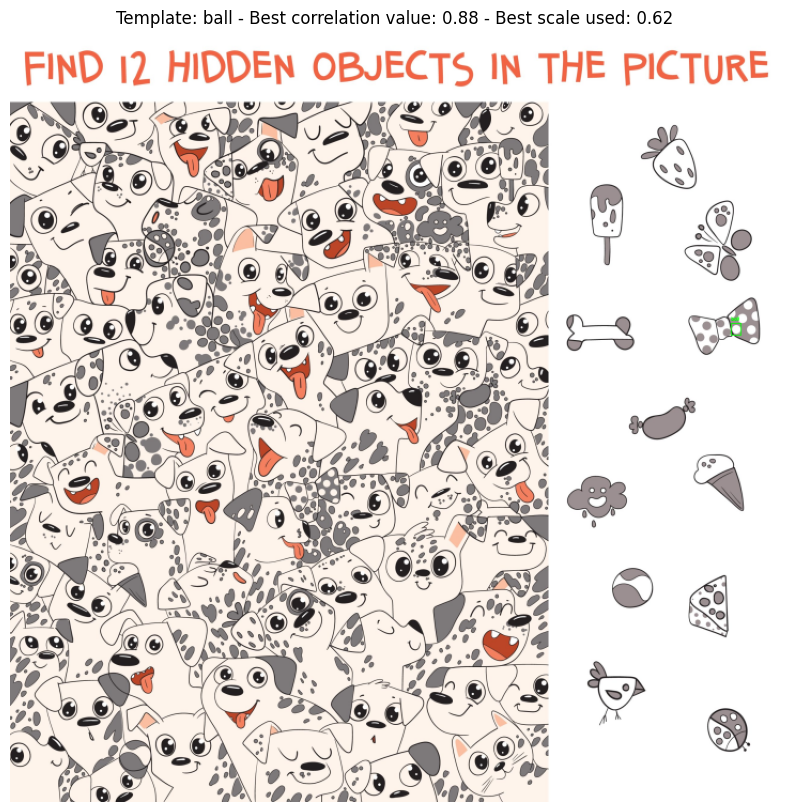

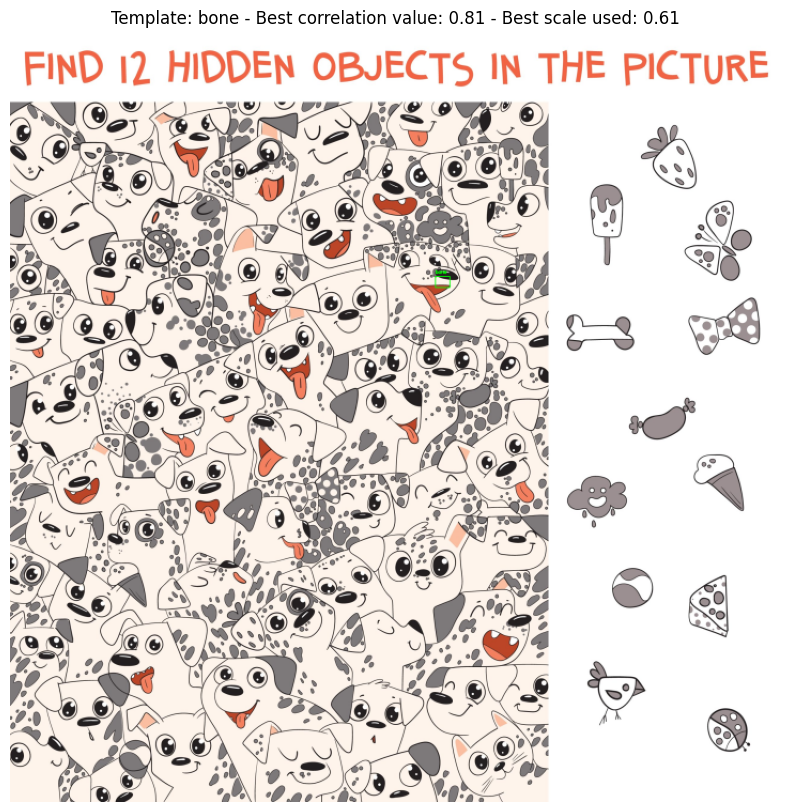

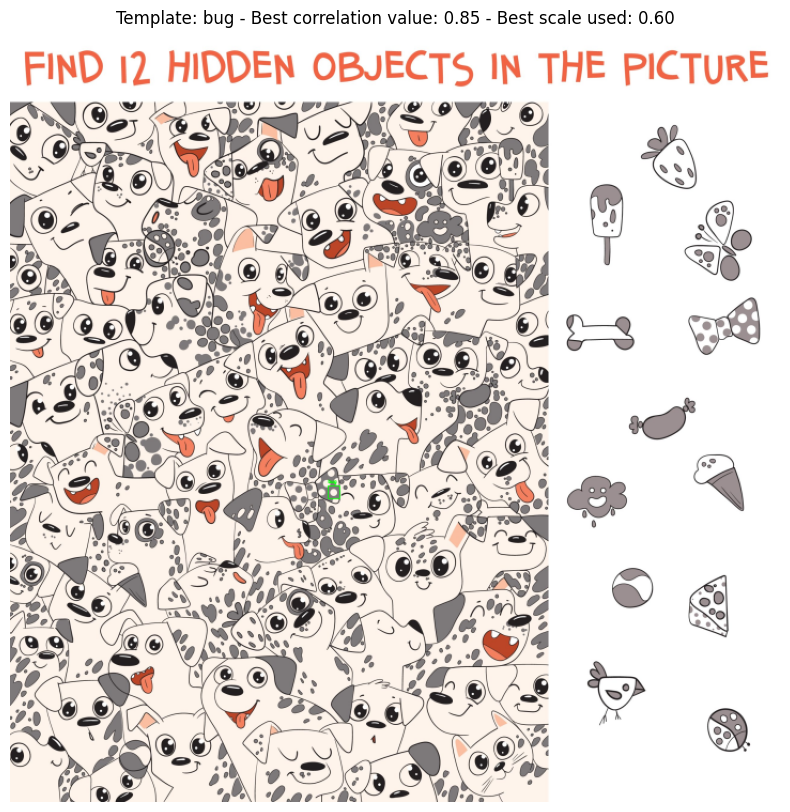

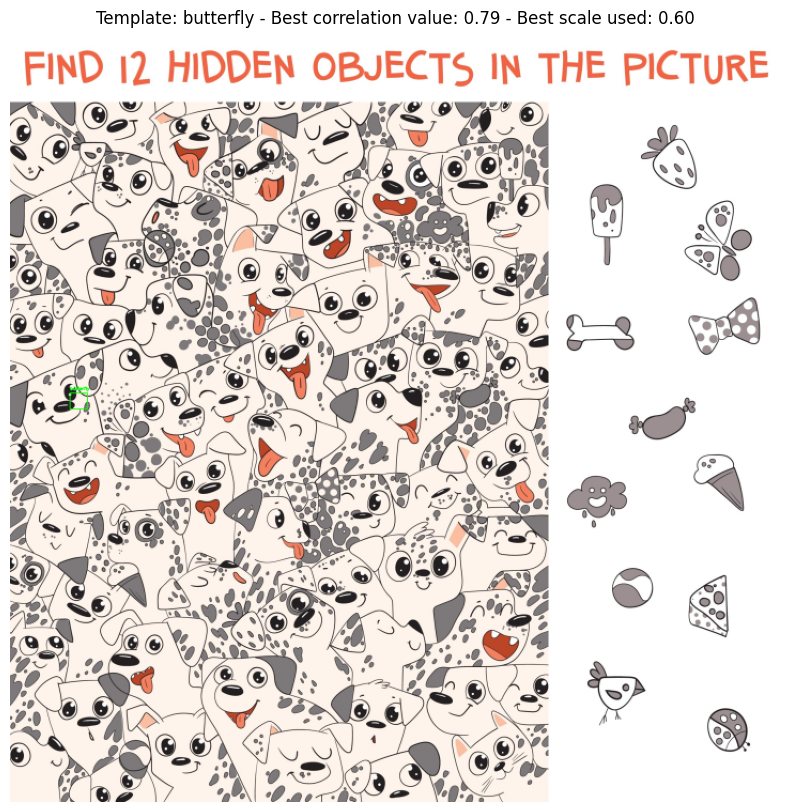

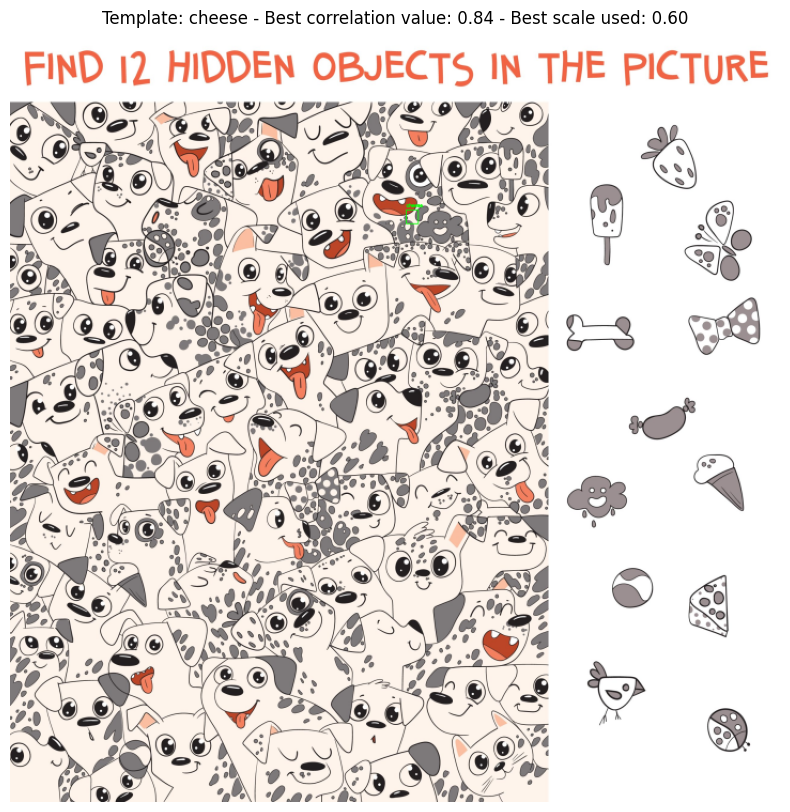

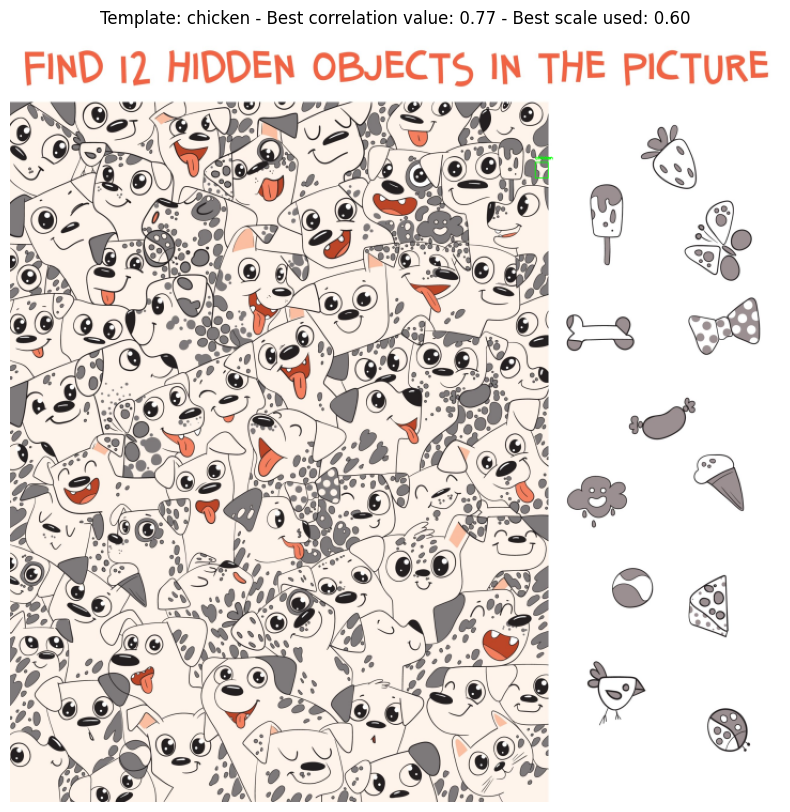

KeyboardInterrupt: 

In [699]:
# Lặp qua từng template để tìm kiếm và hiển thị
templates_2_name=['ball','bone','bug','butterfly','cheese','chicken','cloud','icreame','popsicle','sausage','strawberry','tie']
for template_name in templates_2_name:
    # Đọc và xử lý template
    template = cv2.imread(f'Finding_templates/image_2/{template_name}.jpg')  # Thay thế đường dẫn đến các template
    template = remove_white_background(template)
    
    # Preprocess và tìm template trong hình ảnh
    top_left, correlation, best_scale = find_template(img, template)

    # Resize template dựa trên tỷ lệ tốt nhất đã tìm được
    template_height, template_width = template.shape[:2]
    scaled_template_height = int(template_height * best_scale)
    scaled_template_width = int(template_width * best_scale)

    bottom_right = (top_left[0] + scaled_template_width, top_left[1] + scaled_template_height)

    # Vẽ hình chữ nhật và ghi tên đối tượng lên ảnh
    output_image = img.copy()
    cv2.rectangle(output_image, top_left, bottom_right, (0, 255, 0), 2)
    cv2.putText(output_image, template_name, (top_left[0], top_left[1] - 10), 
                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

    # Resize ảnh đầu ra để phù hợp với màn hình
    resized_output = resize_image_to_fit_screen(output_image)

    # Chuyển đổi từ BGR sang RGB cho Matplotlib
    output_image_rgb = cv2.cvtColor(resized_output, cv2.COLOR_BGR2RGB)

    # Hiển thị kết quả
    plt.figure(figsize=(10, 10))
    plt.imshow(output_image_rgb)
    plt.title(f"Template: {template_name} - Best correlation value: {correlation:.2f} - Best scale used: {best_scale:.2f}")
    plt.axis('off')
    plt.show()

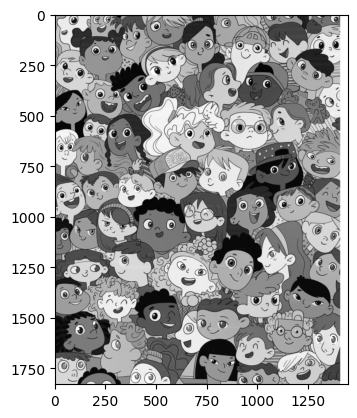

In [692]:
plt.imshow(preprocess_image(img), cmap='gray')

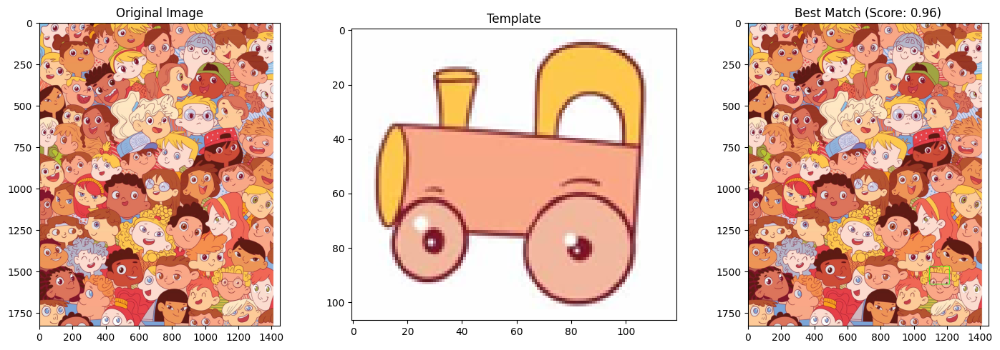

Best correlation value: 0.96


In [694]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def create_mask(template, threshold=240):
    gray = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
    _, mask = cv2.threshold(gray, threshold, 255, cv2.THRESH_BINARY_INV)
    return mask

def histogram_based_matching(image, template, mask, method=cv2.TM_CCORR_NORMED):
    h, w = template.shape[:2]
    result = cv2.matchTemplate(image, template, method, mask=mask)
    
    # Normalize result to 0-1 range
    cv2.normalize(result, result, 0, 1, cv2.NORM_MINMAX)
    
    # Calculate histogram of template (only non-zero mask areas)
    template_hist = cv2.calcHist([template], [0, 1, 2], mask, [8, 8, 8], [0, 256, 0, 256, 0, 256])
    cv2.normalize(template_hist, template_hist, 0, 1, cv2.NORM_MINMAX)
    
    # Slide through the image
    for y in range(result.shape[0]):
        for x in range(result.shape[1]):
            # Extract region of interest
            roi = image[y:y+h, x:x+w]
            # Calculate histogram of ROI (only non-zero mask areas)
            roi_hist = cv2.calcHist([roi], [0, 1, 2], mask, [8, 8, 8], [0, 256, 0, 256, 0, 256])
            cv2.normalize(roi_hist, roi_hist, 0, 1, cv2.NORM_MINMAX)
            # Compare histograms
            hist_match = cv2.compareHist(template_hist, roi_hist, cv2.HISTCMP_CORREL)
            # Combine template matching result with histogram matching
            result[y, x] *= hist_match
    
    return result

def find_best_match(result):
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)
    return max_loc, max_val
image = img.copy()
template = cv2.imread('Finding_templates/image_1/train.jpg')
# Create mask for template
mask = create_mask(template)

# Perform histogram-based matching
result = histogram_based_matching(image, template, mask)

# Find best match
top_left, match_value = find_best_match(result)

# Draw result
h, w = template.shape[:2]
bottom_right = (top_left[0] + w, top_left[1] + h)
result_image = image.copy()
cv2.rectangle(result_image, top_left, bottom_right, (0, 255, 0), 2)

# Display results
plt.figure(figsize=(15, 5))
plt.subplot(131), plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB)), plt.title('Original Image')
plt.subplot(132), plt.imshow(cv2.cvtColor(template, cv2.COLOR_BGR2RGB)), plt.title('Template')
plt.subplot(133), plt.imshow(cv2.cvtColor(result_image, cv2.COLOR_BGR2RGB)), plt.title(f'Best Match (Score: {match_value:.2f})')
plt.tight_layout()
plt.show()

print(f"Best correlation value: {match_value:.2f}")